In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from cartopy.io.img_tiles import GoogleTiles
from cartopy.mpl.geoaxes import GeoAxes
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.markers import MarkerStyle

from bq.queries import run_query
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [ ]:
# GDelt project
events = pd.DataFrame(
	[
		run_query(f"""
			select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events`
		where ActionGeo_Lat is not null and ActionGeo_Long is not null
		order by SQLDATE asc
		limit 100000
		offset {i * 100000}
	""", debug=True) for i in range(100)
	]
)


# events = pd.DataFrame(
# 	run_query(
# 		"""
# 		select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events`
# 		where ActionGeo_Lat is not null and ActionGeo_Long is not null
# 		order by SQLDATE asc
# 		limit 10000000
# 		""",
# 		debug=True
# 	)
# )

events.head(n=15)

Running query: select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events` where ActionGeo_Lat is not null and ActionGeo_Long is not null order by SQLDATE asc limit 100000 offset 0
Query complete, fetching data.

Downloading:   0%|          |
Downloading: 100%|██████████|
Fetched 100000 rows.
Running query: select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events` where ActionGeo_Lat is not null and ActionGeo_Long is not null order by SQLDATE asc limit 100000 offset 100000
Query complete, fetching data.

Downloading:   0%|          |
Downloading: 100%|██████████|
Fetched 100000 rows.
Running query: select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events` where ActionGeo_Lat is not null and ActionGeo_Long is not null order by SQLDATE asc limit 100000 offset 200000
Query complete, fetching data.

Downloading:   0%|          |
Downloading: 100%|██████████|
Fetched 100000 rows.
Running query: select ActionGeo_Lat, ActionGeo_Long, SQLD

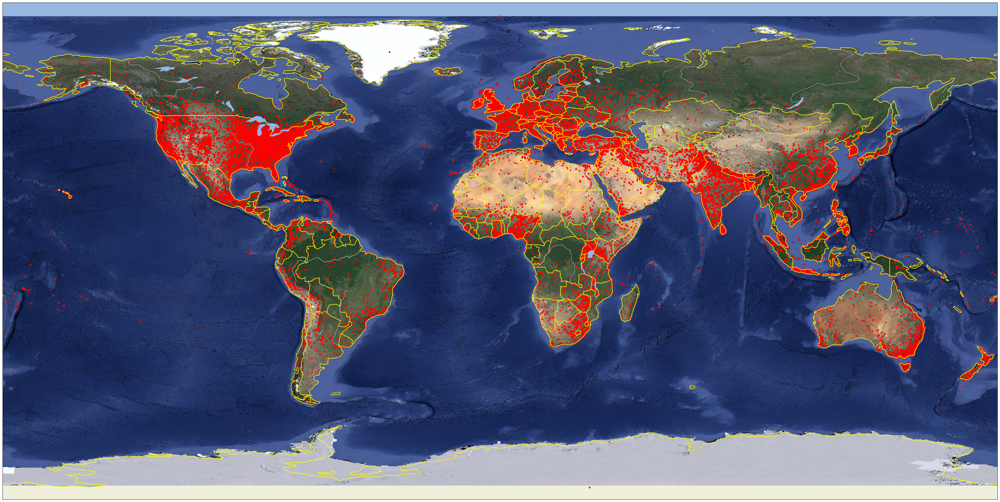

In [3]:
# plot a map of the events
fig = plt.figure(figsize=(50, 30))
ax: GeoAxes = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.coastlines(linestyle='-', color='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle='-', edgecolor='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
tiler = GoogleTiles(style="satellite", cache=True)
ax.add_image(tiler, 4)

ax.scatter(
	events['ActionGeo_Long'],
	events['ActionGeo_Lat'],
	transform=ccrs.PlateCarree(),
	color='red',
	marker='.',
)

plt.show()

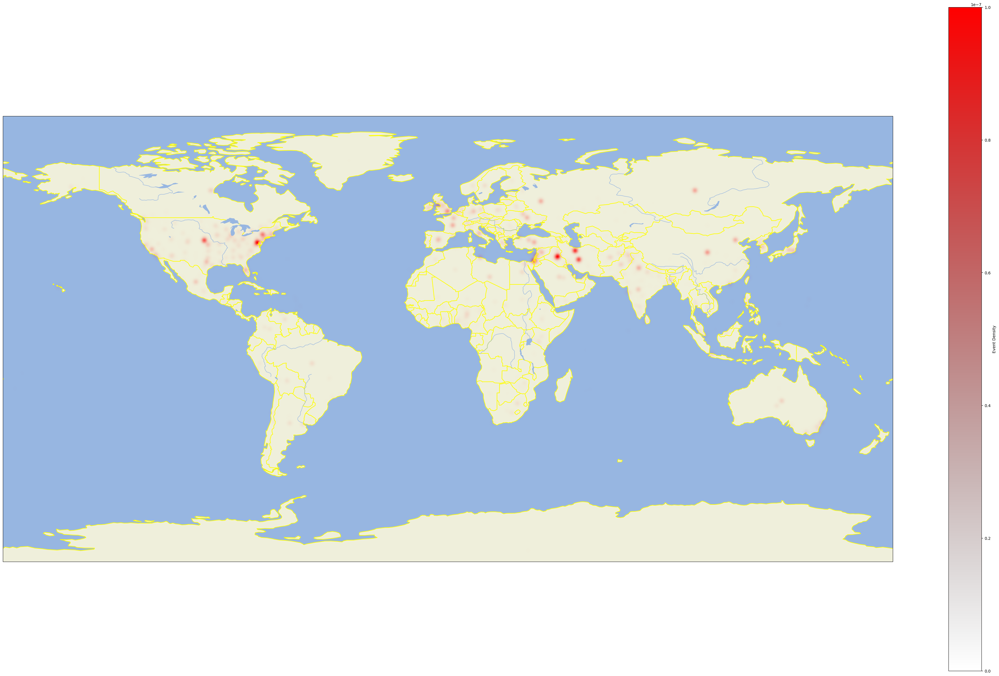

In [6]:
from scipy.ndimage import gaussian_filter

# Create a scatter plot with a Gaussian filter for a smoother look
fig = plt.figure(figsize=(50, 30))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.coastlines(linestyle='-', color='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle='-', edgecolor='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
# tiler = GoogleTiles(style="satellite", cache=True)
# ax.add_image(tiler, 4)

# Create a density map using Gaussian filter
lon = events['ActionGeo_Long']
lat = events['ActionGeo_Lat']

# Create a 2D histogram
pixels_density = 1000
lon_bins = np.linspace(-180, 180, pixels_density * 2)
lat_bins = np.linspace(-90, 90, pixels_density)
hist, lon_edges, lat_edges = np.histogram2d(lon, lat, bins=[lon_bins, lat_bins], density=True)

# Apply Gaussian filter to the histogram
hist = gaussian_filter(hist, sigma=4)

# Normalize the histogram to be between 0 and 1
hist = (hist - np.min(hist)) / (np.max(hist) - np.min(hist))
# Plot the density map
lon_centers = (lon_edges[:-1] + lon_edges[1:]) / 2
lat_centers = (lat_edges[:-1] + lat_edges[1:]) / 2

# Color map is 1 = red, 0 = transparent

# Create a custom colormap
cmap = LinearSegmentedColormap.from_list("red_tr",
	colors=[(0, 0, 0, 0), 'red'],
)

mesh = ax.pcolormesh(lon_centers, lat_centers, hist.T, transform=ccrs.PlateCarree(), cmap=cmap, alpha=1, vmax=0.0000001)

# transparencies is a list of each event's transparency
transparencies = hist.T.flatten()
mesh.set_alpha(transparencies)

plt.colorbar(mesh, ax=ax, orientation='vertical', label='Event Density')
plt.show()